In [12]:
import networkx as nx
import pandas as pd
import matplotlib.pyplot as plt
import random


In [14]:
file_path = 'DD-Miner_miner-disease-disease.tsv'
disease_data = pd.read_csv(file_path, sep='\t')


In [15]:
edges = []
for index, row in disease_data.iterrows():
    edges.append((row['# Disease(DOID)'], row['Disease(DOID)']))

In [16]:
G = nx.Graph()
G.add_edges_from(edges)

In [18]:
pos = nx.kamada_kawai_layout(G)

In [19]:
def network_metrics(G):
    size_of_network = G.number_of_nodes()
    number_of_links = G.number_of_edges()
    clustering_coefficient = nx.average_clustering(G)
    try:
        average_path_length = nx.average_shortest_path_length(G)
    except nx.NetworkXError:
        average_path_length = float('inf')  # For disconnected networks
    
    return {
        "Size of Network": size_of_network,
        "Number of Links": number_of_links,
        "Clustering Coefficient": clustering_coefficient,
        "Average Path Length": average_path_length
    }

In [20]:
def plot_network(G, title):
    plt.figure(figsize=(12, 12))
    pos
    nx.draw(G, pos, with_labels=False, node_size=20, font_size=8, font_color='black')
    plt.title(title)
    plt.show()

In [21]:
def plot_degree_distribution(G, title):
    degrees = [d for n, d in G.degree()]
    plt.figure(figsize=(8, 6))
    plt.hist(degrees, bins=20, edgecolor='black')
    plt.title(title)
    plt.xlabel('Degree')
    plt.ylabel('Frequency')
    plt.show()

Original Network Metrics:
{'Size of Network': 6878, 'Number of Links': 6877, 'Clustering Coefficient': 0.0, 'Average Path Length': 11.197065640964189}


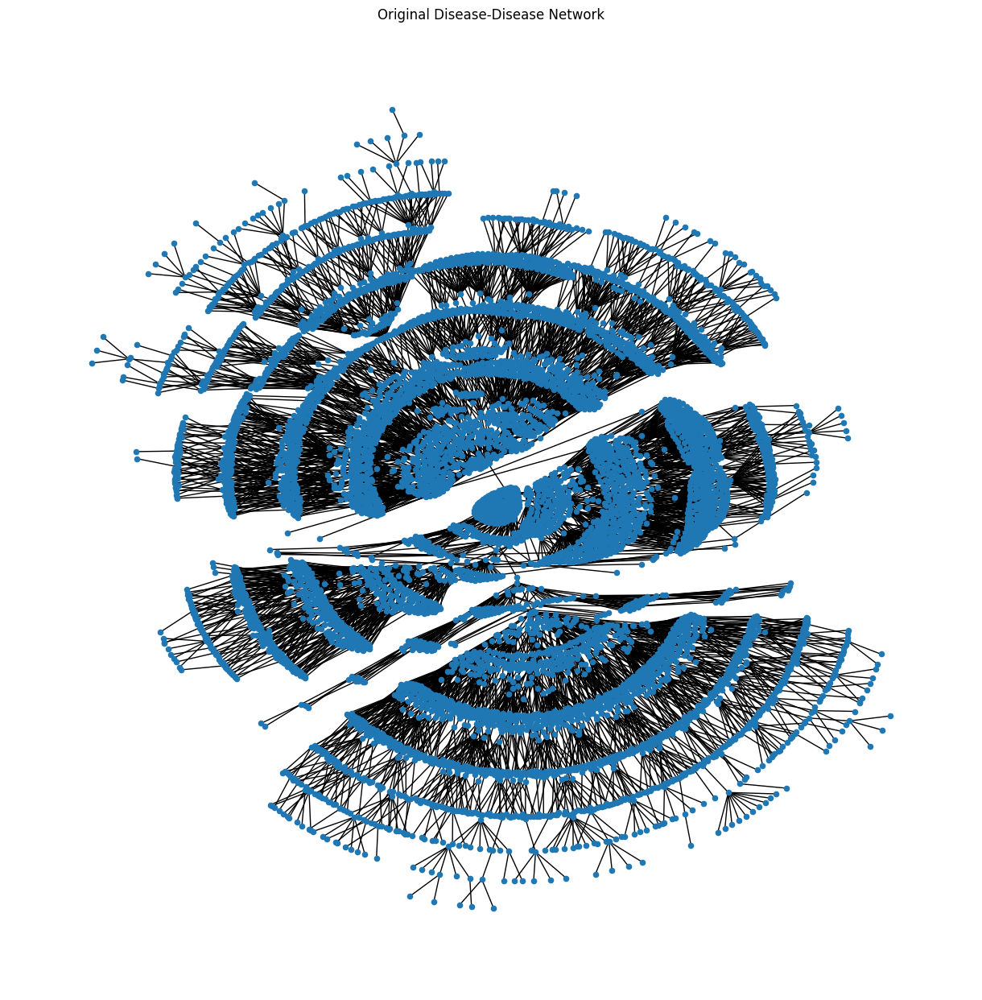

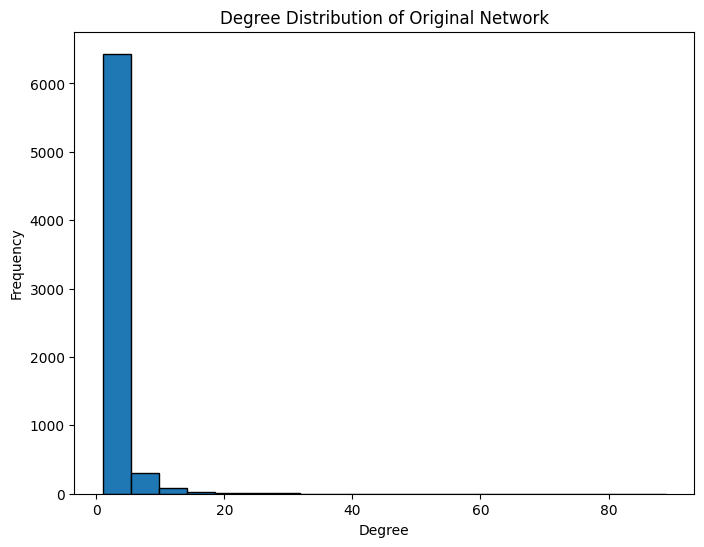

In [22]:
print("Original Network Metrics:")
original_metrics = network_metrics(G)
print(original_metrics)
plot_network(G, "Original Disease-Disease Network")
plot_degree_distribution(G, "Degree Distribution of Original Network")

In [23]:
degree_centrality = nx.degree_centrality(G)
betweenness_centrality = nx.betweenness_centrality(G, normalized=True)
closeness_centrality = nx.closeness_centrality(G)
eigenvector_centrality = nx.eigenvector_centrality(G, max_iter=1000)


In [54]:
top_degree = sorted(degree_centrality.items(), key=lambda x: x[1], reverse=True)[:3]
top_betweenness = sorted(betweenness_centrality.items(), key=lambda x: x[1], reverse=True)[:3]
top_closeness = sorted(closeness_centrality.items(), key=lambda x: x[1], reverse=True)[:3]
top_eigenvector = sorted(eigenvector_centrality.items(), key=lambda x: x[1], reverse=True)[:3]


In [55]:
DC_nodes = [node for node, _ in top_degree]
BC_nodes = [node for node, _ in top_betweenness]
CC_nodes = [node for node, _ in top_closeness]
EC_nodes = [node for node, _ in top_eigenvector]


In [56]:
def get_linked_nodes(G, highlight_nodes, radius=2):
    linked_nodes_dict = {}
    for node in highlight_nodes:
        neighbors = nx.single_source_shortest_path_length(G, node, cutoff=radius).keys()
        linked_nodes_dict[node] = list(neighbors)
        
        subgraph = G.subgraph(neighbors)
        
        plt.figure(figsize=(8, 8))
        sub_pos = nx.spring_layout(subgraph, seed=42)
        nx.draw(subgraph, sub_pos, with_labels=True, node_size=50, font_size=8, font_color='black')
        nx.draw_networkx_nodes(subgraph, sub_pos, nodelist=[node], node_size=100, node_color='red')
        plt.title(f"Zoom on {node}")
        plt.show()
    return linked_nodes_dict

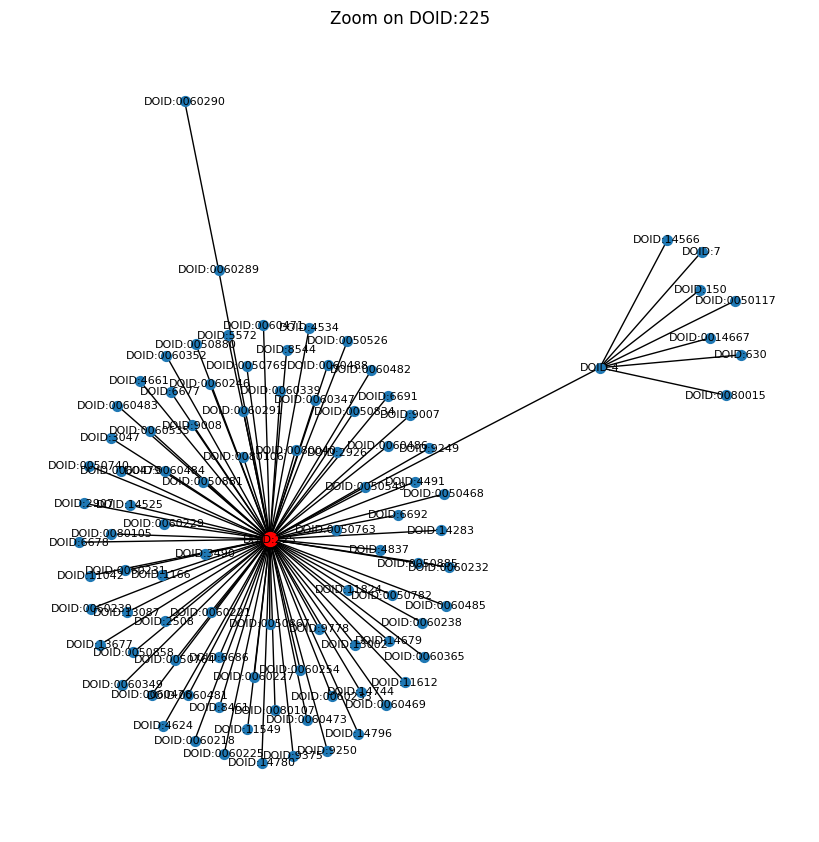

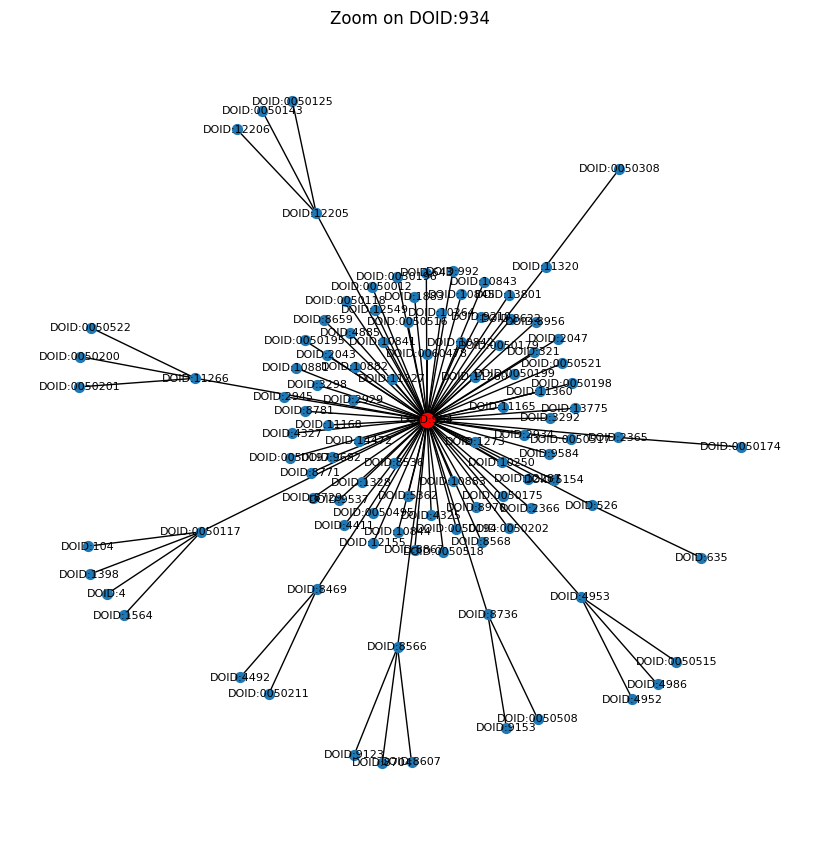

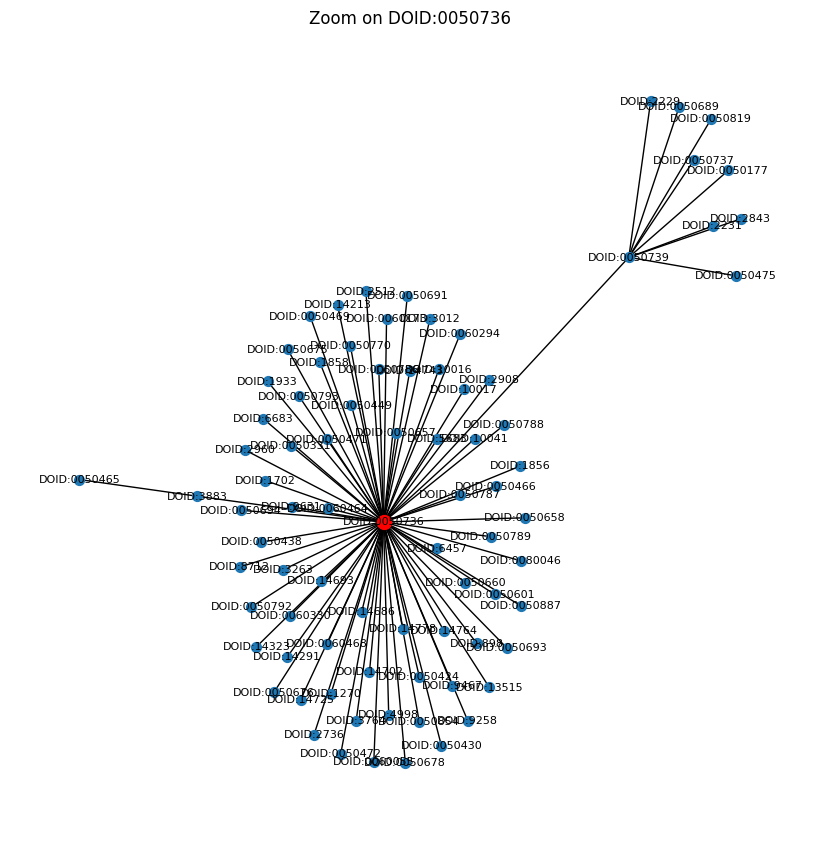

{'DOID:225': ['DOID:225',
  'DOID:0050468',
  'DOID:0050526',
  'DOID:0050549',
  'DOID:0050740',
  'DOID:0050763',
  'DOID:0050764',
  'DOID:0050769',
  'DOID:0050782',
  'DOID:0050834',
  'DOID:0050858',
  'DOID:0050867',
  'DOID:0050880',
  'DOID:0050881',
  'DOID:0050885',
  'DOID:0060218',
  'DOID:0060221',
  'DOID:0060225',
  'DOID:0060227',
  'DOID:0060229',
  'DOID:0060231',
  'DOID:0060232',
  'DOID:0060233',
  'DOID:0060238',
  'DOID:0060239',
  'DOID:0060246',
  'DOID:0060254',
  'DOID:0060289',
  'DOID:0060291',
  'DOID:0060339',
  'DOID:0060347',
  'DOID:0060349',
  'DOID:0060352',
  'DOID:0060365',
  'DOID:0060469',
  'DOID:0060471',
  'DOID:0060473',
  'DOID:0060476',
  'DOID:0060479',
  'DOID:0060481',
  'DOID:0060482',
  'DOID:0060483',
  'DOID:0060484',
  'DOID:0060485',
  'DOID:0060486',
  'DOID:0060488',
  'DOID:0060535',
  'DOID:0080040',
  'DOID:0080105',
  'DOID:0080106',
  'DOID:0080107',
  'DOID:11042',
  'DOID:11549',
  'DOID:11612',
  'DOID:1166',
  'DOID:118

In [57]:
DC_linked_nodes = get_linked_nodes(G, DC_nodes)
DC_linked_nodes

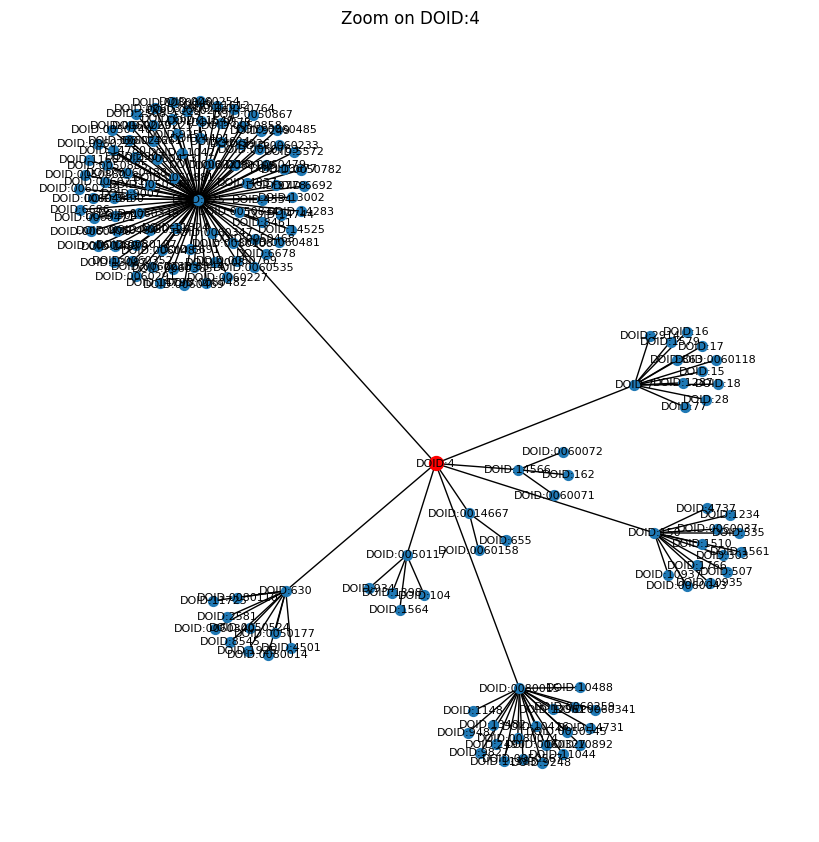

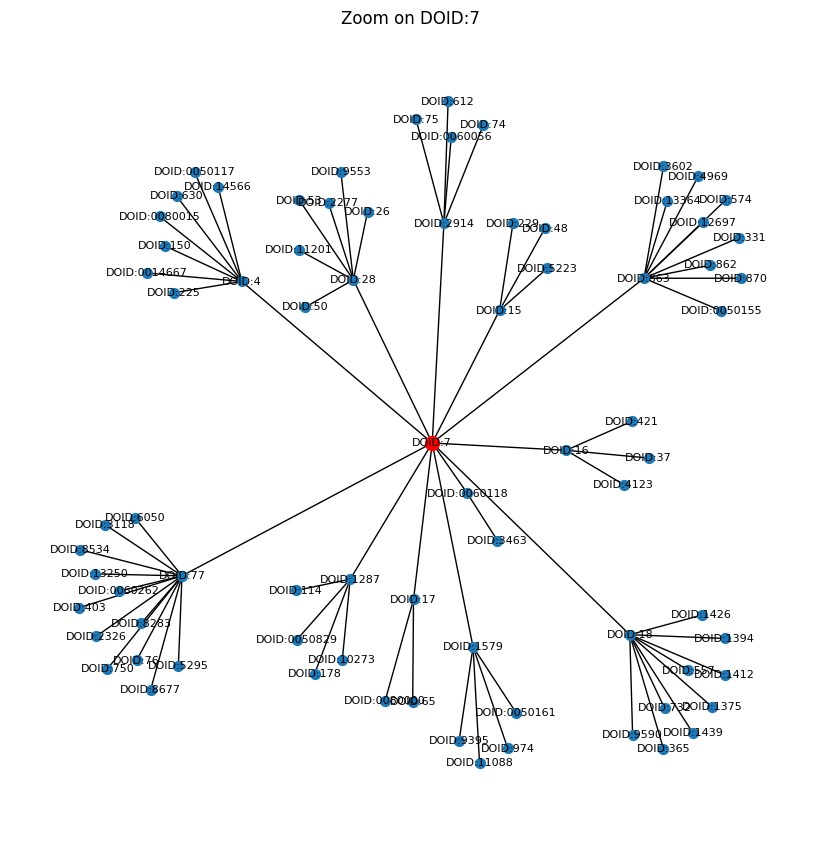

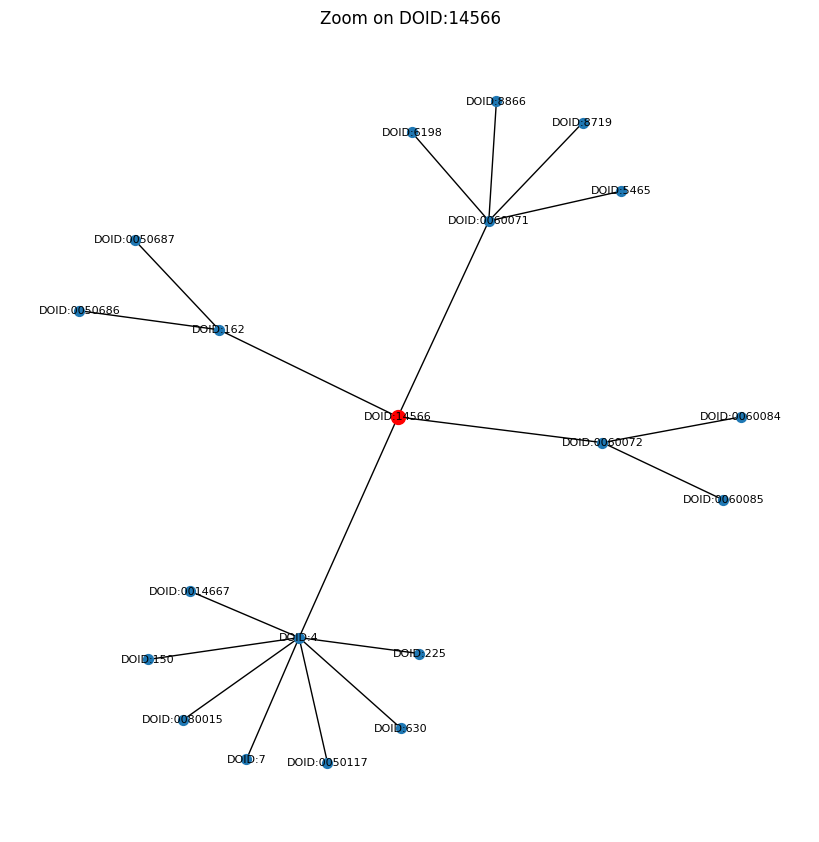

{'DOID:4': ['DOID:4',
  'DOID:0014667',
  'DOID:0050117',
  'DOID:0080015',
  'DOID:14566',
  'DOID:150',
  'DOID:225',
  'DOID:630',
  'DOID:7',
  'DOID:0060158',
  'DOID:655',
  'DOID:104',
  'DOID:1398',
  'DOID:1564',
  'DOID:934',
  'DOID:0050545',
  'DOID:0050567',
  'DOID:0060259',
  'DOID:0060327',
  'DOID:0060341',
  'DOID:0080074',
  'DOID:10426',
  'DOID:10488',
  'DOID:10892',
  'DOID:11044',
  'DOID:11383',
  'DOID:1148',
  'DOID:12961',
  'DOID:13482',
  'DOID:14731',
  'DOID:2490',
  'DOID:9248',
  'DOID:9487',
  'DOID:9827',
  'DOID:0060071',
  'DOID:0060072',
  'DOID:162',
  'DOID:0060037',
  'DOID:0060043',
  'DOID:10935',
  'DOID:10937',
  'DOID:1234',
  'DOID:1510',
  'DOID:1561',
  'DOID:1766',
  'DOID:303',
  'DOID:4737',
  'DOID:507',
  'DOID:535',
  'DOID:0050468',
  'DOID:0050526',
  'DOID:0050549',
  'DOID:0050740',
  'DOID:0050763',
  'DOID:0050764',
  'DOID:0050769',
  'DOID:0050782',
  'DOID:0050834',
  'DOID:0050858',
  'DOID:0050867',
  'DOID:0050880',
  

In [58]:
BC_linked_nodes = get_linked_nodes(G, BC_nodes)
BC_linked_nodes

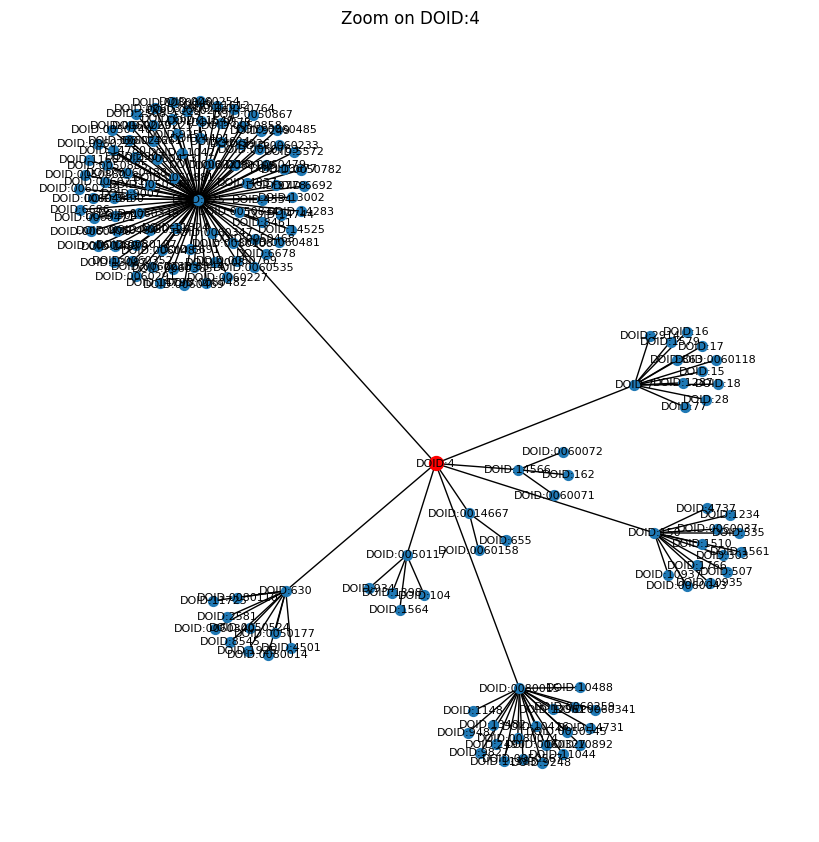

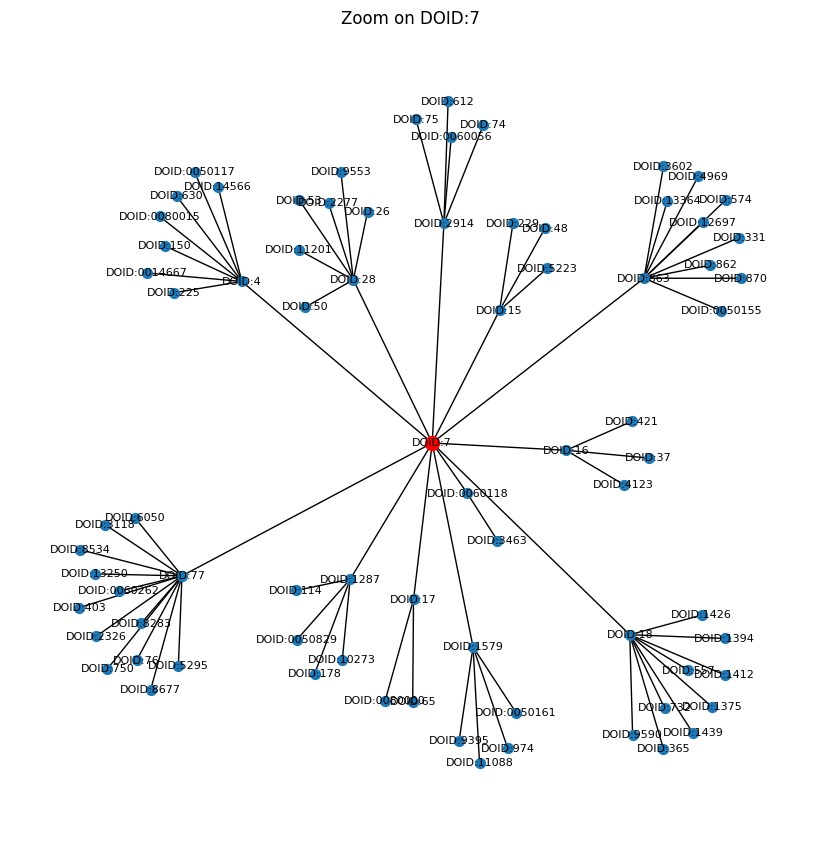

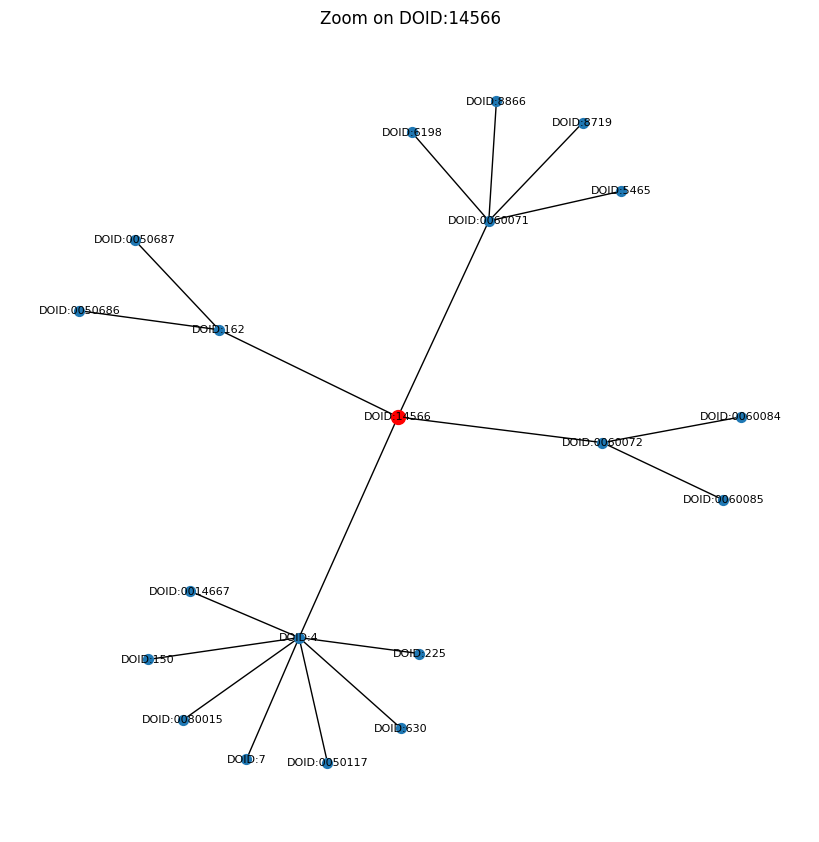

{'DOID:4': ['DOID:4',
  'DOID:0014667',
  'DOID:0050117',
  'DOID:0080015',
  'DOID:14566',
  'DOID:150',
  'DOID:225',
  'DOID:630',
  'DOID:7',
  'DOID:0060158',
  'DOID:655',
  'DOID:104',
  'DOID:1398',
  'DOID:1564',
  'DOID:934',
  'DOID:0050545',
  'DOID:0050567',
  'DOID:0060259',
  'DOID:0060327',
  'DOID:0060341',
  'DOID:0080074',
  'DOID:10426',
  'DOID:10488',
  'DOID:10892',
  'DOID:11044',
  'DOID:11383',
  'DOID:1148',
  'DOID:12961',
  'DOID:13482',
  'DOID:14731',
  'DOID:2490',
  'DOID:9248',
  'DOID:9487',
  'DOID:9827',
  'DOID:0060071',
  'DOID:0060072',
  'DOID:162',
  'DOID:0060037',
  'DOID:0060043',
  'DOID:10935',
  'DOID:10937',
  'DOID:1234',
  'DOID:1510',
  'DOID:1561',
  'DOID:1766',
  'DOID:303',
  'DOID:4737',
  'DOID:507',
  'DOID:535',
  'DOID:0050468',
  'DOID:0050526',
  'DOID:0050549',
  'DOID:0050740',
  'DOID:0050763',
  'DOID:0050764',
  'DOID:0050769',
  'DOID:0050782',
  'DOID:0050834',
  'DOID:0050858',
  'DOID:0050867',
  'DOID:0050880',
  

In [59]:
CC_linked_nodes = get_linked_nodes(G, CC_nodes)
CC_linked_nodes

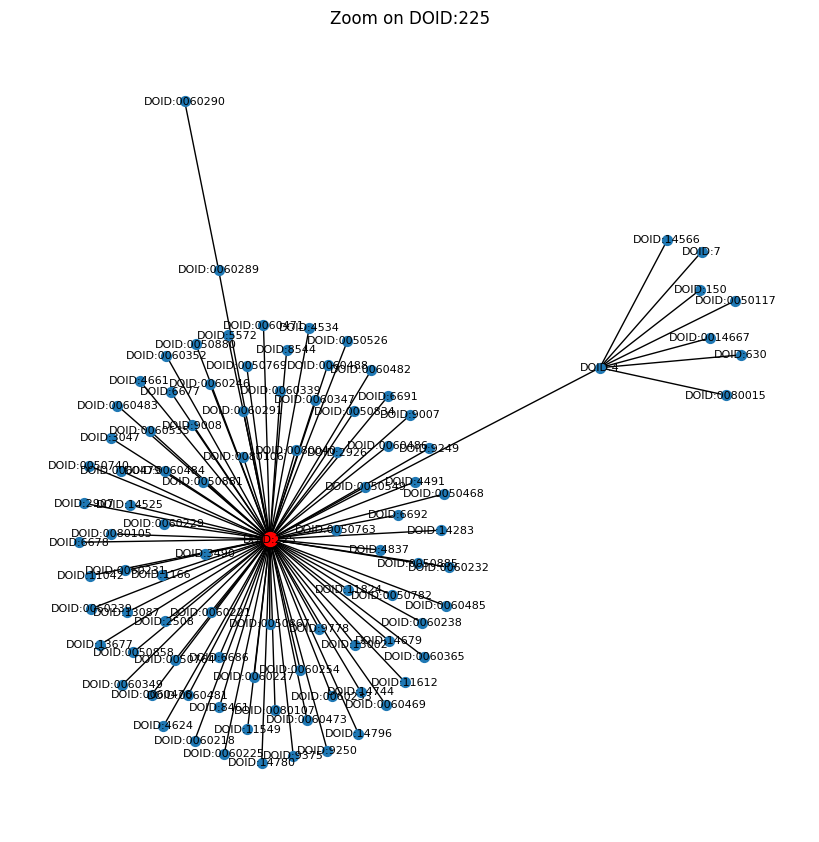

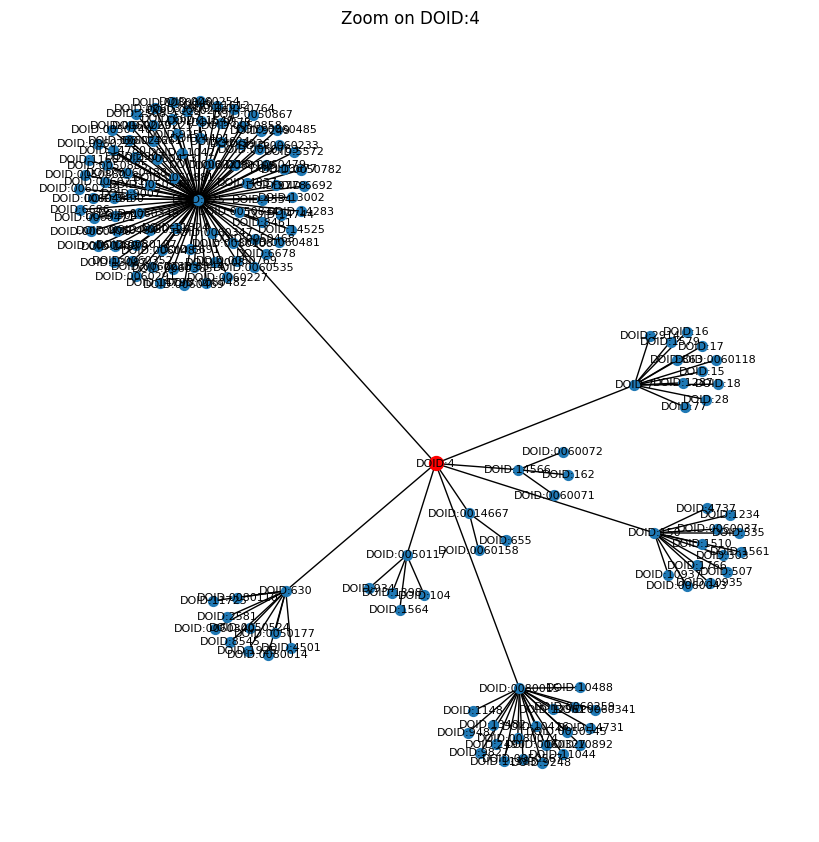

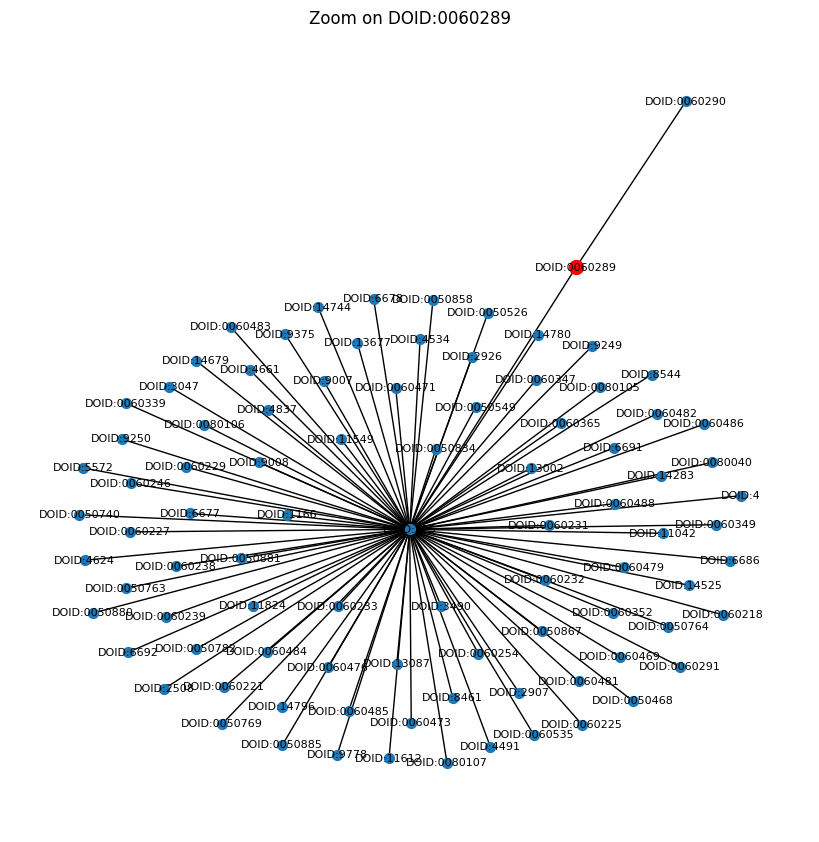

{'DOID:225': ['DOID:225',
  'DOID:0050468',
  'DOID:0050526',
  'DOID:0050549',
  'DOID:0050740',
  'DOID:0050763',
  'DOID:0050764',
  'DOID:0050769',
  'DOID:0050782',
  'DOID:0050834',
  'DOID:0050858',
  'DOID:0050867',
  'DOID:0050880',
  'DOID:0050881',
  'DOID:0050885',
  'DOID:0060218',
  'DOID:0060221',
  'DOID:0060225',
  'DOID:0060227',
  'DOID:0060229',
  'DOID:0060231',
  'DOID:0060232',
  'DOID:0060233',
  'DOID:0060238',
  'DOID:0060239',
  'DOID:0060246',
  'DOID:0060254',
  'DOID:0060289',
  'DOID:0060291',
  'DOID:0060339',
  'DOID:0060347',
  'DOID:0060349',
  'DOID:0060352',
  'DOID:0060365',
  'DOID:0060469',
  'DOID:0060471',
  'DOID:0060473',
  'DOID:0060476',
  'DOID:0060479',
  'DOID:0060481',
  'DOID:0060482',
  'DOID:0060483',
  'DOID:0060484',
  'DOID:0060485',
  'DOID:0060486',
  'DOID:0060488',
  'DOID:0060535',
  'DOID:0080040',
  'DOID:0080105',
  'DOID:0080106',
  'DOID:0080107',
  'DOID:11042',
  'DOID:11549',
  'DOID:11612',
  'DOID:1166',
  'DOID:118

In [60]:
EC_linked_nodes = get_linked_nodes(G, EC_nodes)
EC_linked_nodes

In [34]:
def random_link_removal(G, removal_fraction):
    G_copy = G.copy()
    edges_to_remove = random.sample(list(G_copy.edges()), int(removal_fraction * G_copy.number_of_edges()))
    G_copy.remove_edges_from(edges_to_remove)
    largest_cc = max(nx.connected_components(G_copy), key=len)
    giant_component_size = len(largest_cc)
    return G_copy, giant_component_size

In [35]:
def random_node_removal(G, removal_fraction):
    G_copy = G.copy()
    nodes_to_remove = random.sample(list(G_copy.nodes()), int(removal_fraction * G_copy.number_of_nodes()))
    G_copy.remove_nodes_from(nodes_to_remove)
    largest_cc = max(nx.connected_components(G_copy), key=len)
    giant_component_size = len(largest_cc)
    return G_copy, giant_component_size


In [36]:
def targeted_node_removal(G, nodes_to_remove):
    G_copy = G.copy()
    G_copy.remove_nodes_from(nodes_to_remove)
    largest_cc = max(nx.connected_components(G_copy), key=len)
    giant_component_size = len(largest_cc)
    return G_copy, giant_component_size


In [37]:
def viral_attack(G, conducting_fraction):
    G_copy = G.copy()
    for edge in list(G_copy.edges()):
        if random.random() > conducting_fraction:
            G_copy.remove_edge(*edge)
    largest_cc = max(nx.connected_components(G_copy), key=len)
    giant_component_size = len(largest_cc)
    return G_copy, giant_component_size

Giant component size after random link removal: 14


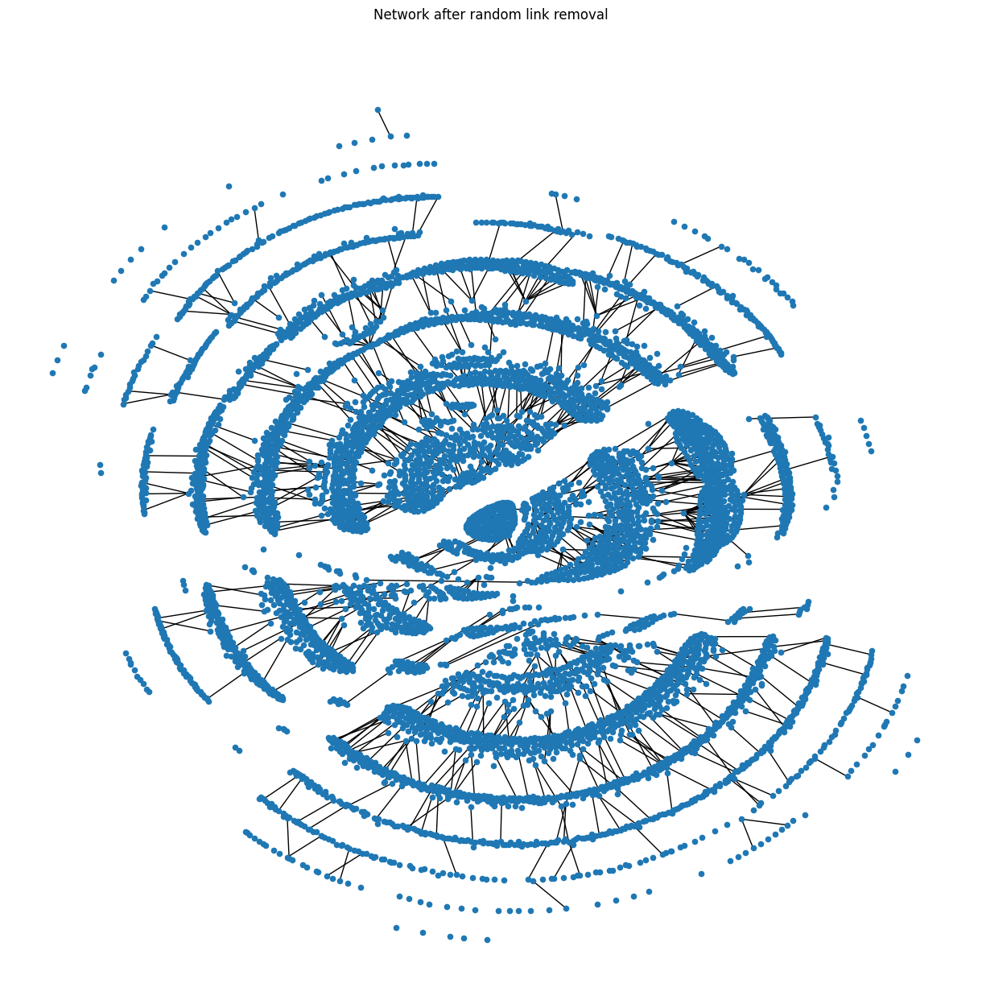

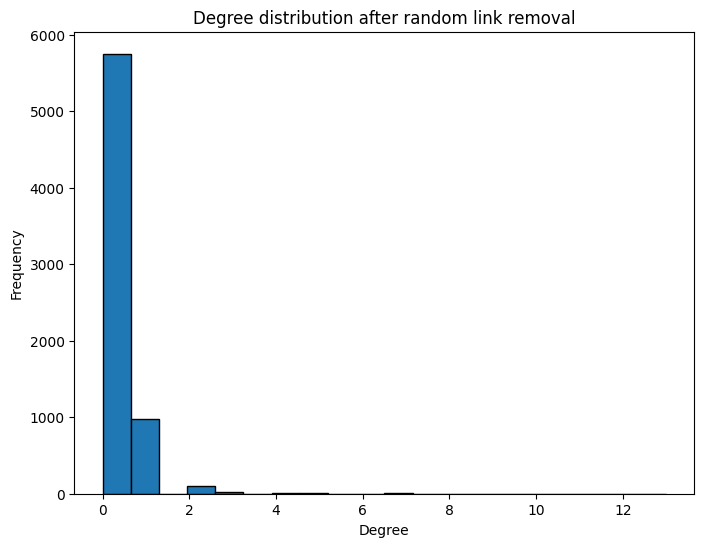

Network metrics after random link removal:
{'Size of Network': 6878, 'Number of Links': 688, 'Clustering Coefficient': 0.0, 'Average Path Length': inf}


In [45]:
G_link_removed, link_removal_impact = random_link_removal(G, 0.9)  # Remove 10% of the links
print(f"Giant component size after random link removal: {link_removal_impact}")
plot_network(G_link_removed, "Network after random link removal")
plot_degree_distribution(G_link_removed, "Degree distribution after random link removal")
print("Network metrics after random link removal:")
print(network_metrics(G_link_removed))


Giant component size after random node removal: 138


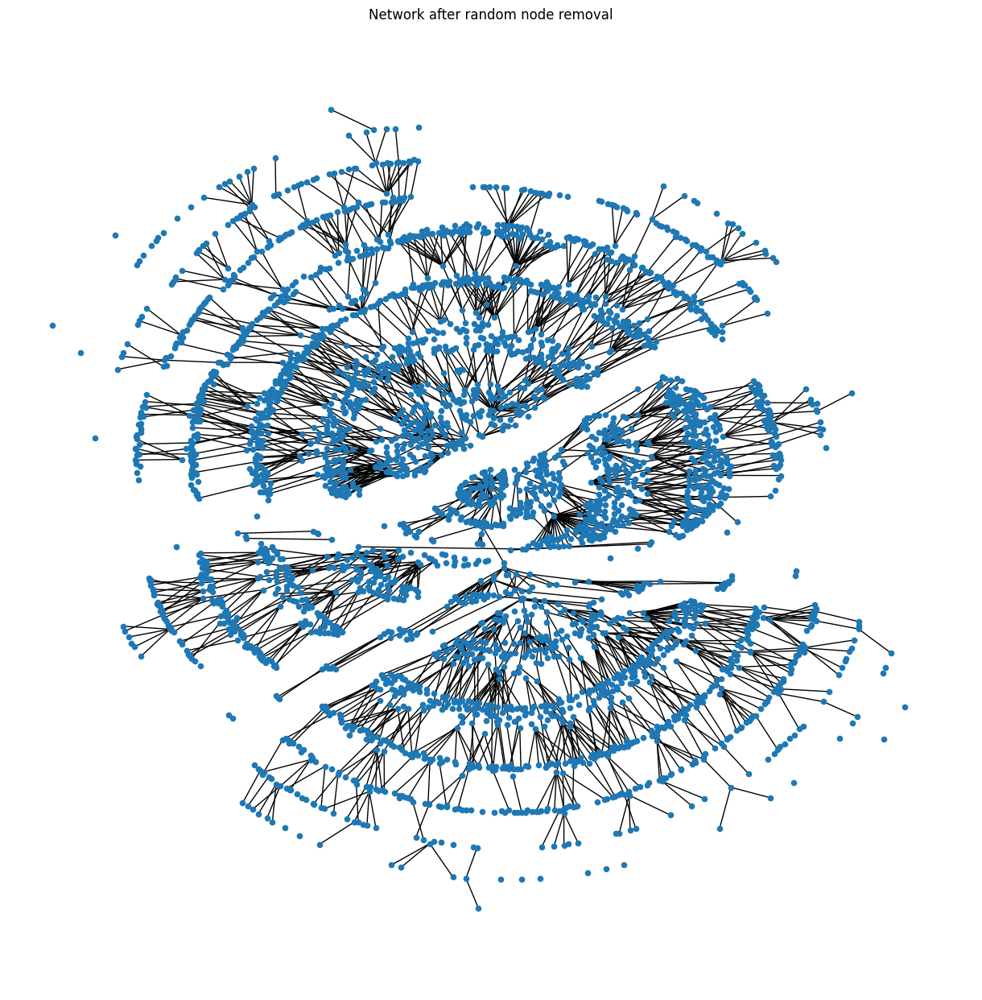

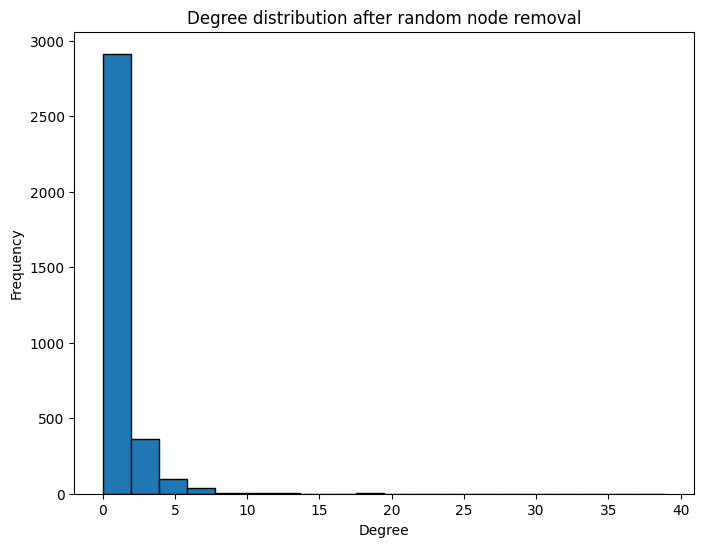

Network metrics after random node removal:
{'Size of Network': 3439, 'Number of Links': 1717, 'Clustering Coefficient': 0.0, 'Average Path Length': inf}


In [42]:
G_node_removed, node_removal_impact = random_node_removal(G, 0.5)  # Remove 10% of the nodes
print(f"Giant component size after random node removal: {node_removal_impact}")
plot_network(G_node_removed, "Network after random node removal")
plot_degree_distribution(G_node_removed, "Degree distribution after random node removal")
print("Network metrics after random node removal:")
print(network_metrics(G_node_removed))

Giant component size after targeted node removal: 6492


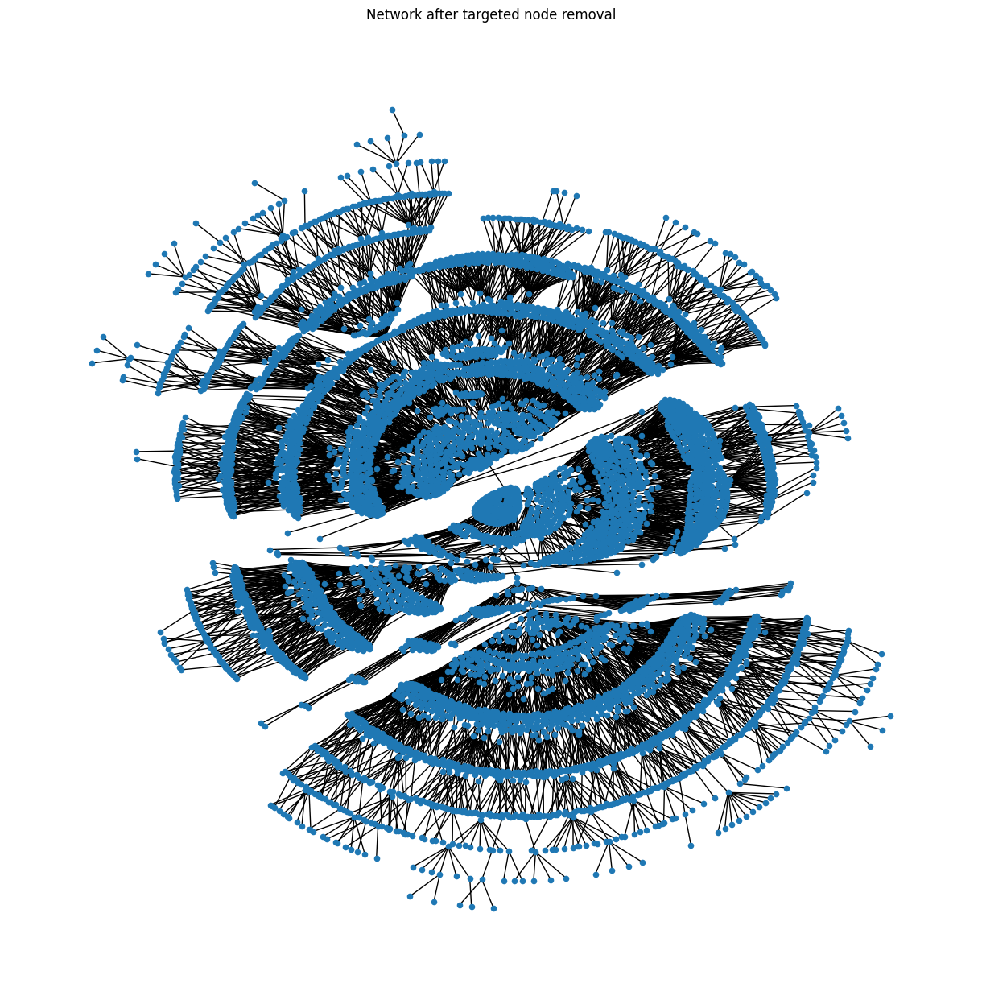

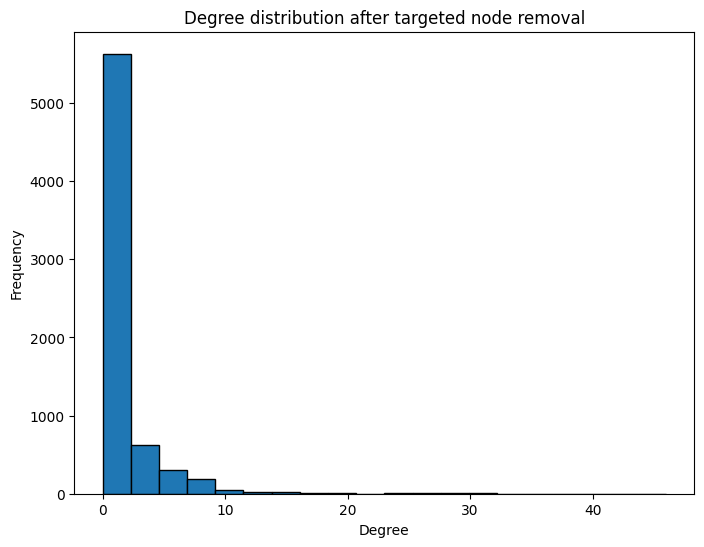

Network Metrics after targeted node removal:
{'Size of Network': 6873, 'Number of Links': 6517, 'Clustering Coefficient': 0.0, 'Average Path Length': inf}


In [43]:
targeted_nodes = [node for node, _ in top_degree[:5]]
G_targeted_removed, targeted_removal_impact = targeted_node_removal(G, targeted_nodes)
print(f"Giant component size after targeted node removal: {targeted_removal_impact}")
plot_network(G_targeted_removed, "Network after targeted node removal")
plot_degree_distribution(G_targeted_removed, "Degree distribution after targeted node removal")
print("Network Metrics after targeted node removal:")
print(network_metrics(G_targeted_removed))

Giant Component Size after Viral Attack: 2451


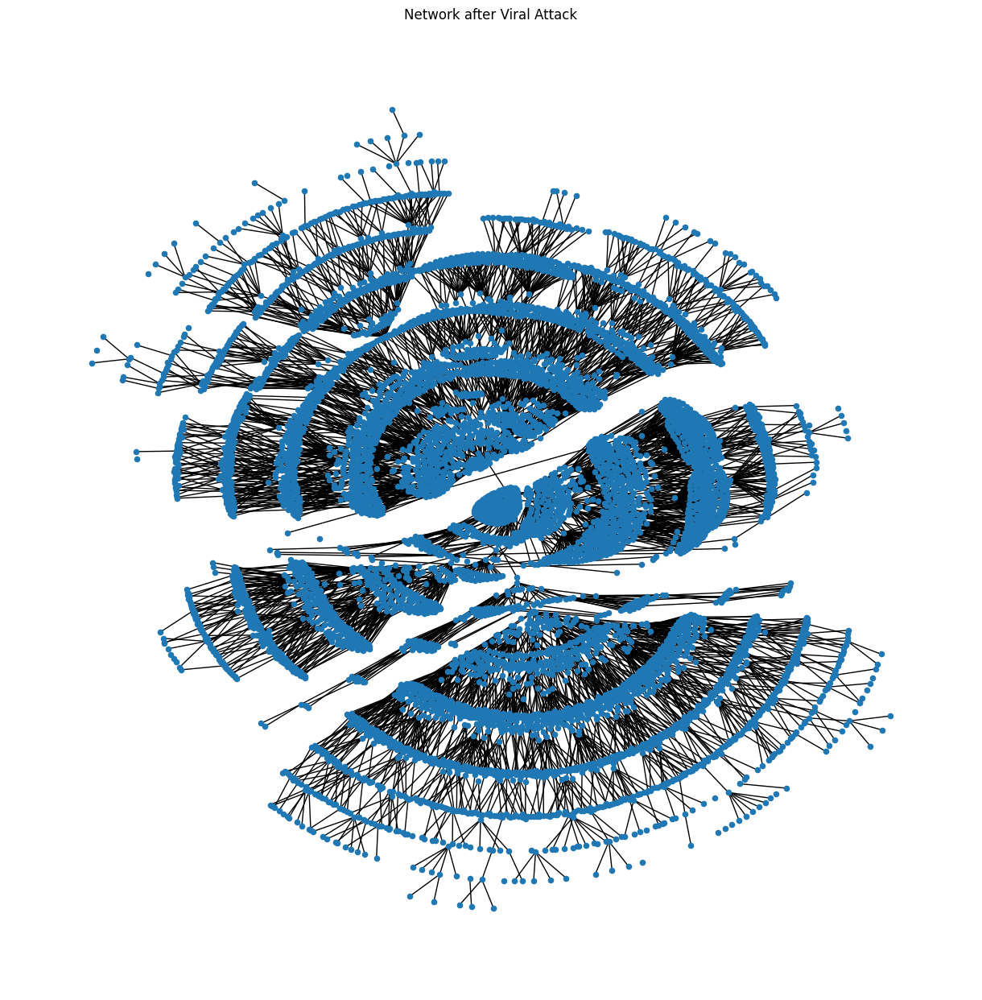

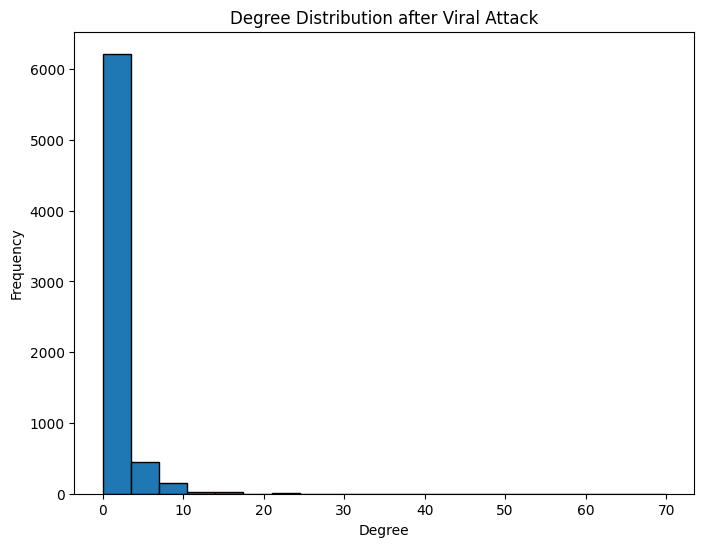

Network Metrics after Viral Attack:
{'Size of Network': 6878, 'Number of Links': 5489, 'Clustering Coefficient': 0.0, 'Average Path Length': inf}


In [41]:

G_viral_attack, viral_attack_impact = viral_attack(G, 0.8)  # 80% of links conduct the attack
print(f"Giant Component Size after Viral Attack: {viral_attack_impact}")
plot_network(G_viral_attack, "Network after Viral Attack")
plot_degree_distribution(G_viral_attack, "Degree Distribution after Viral Attack")
print("Network Metrics after Viral Attack:")
print(network_metrics(G_viral_attack))

Giant Component Size after 10% Random Link Removal: 2256


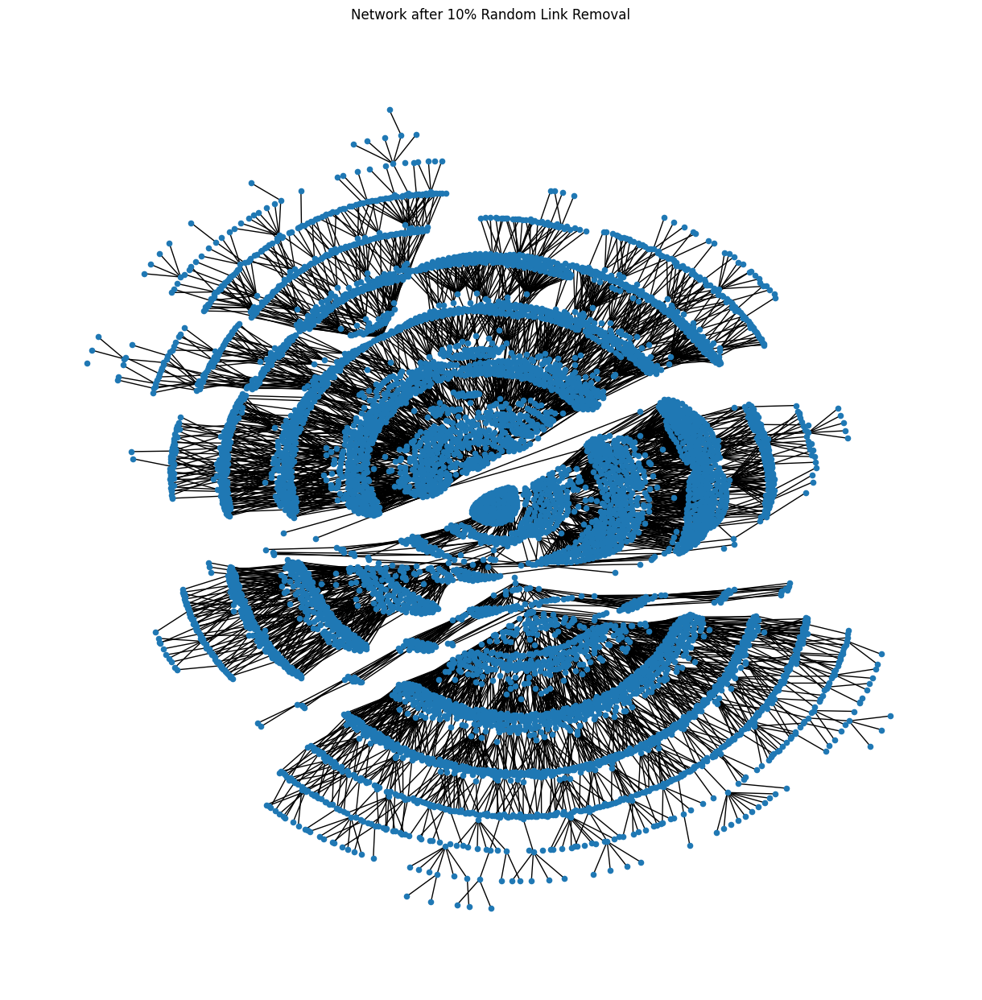

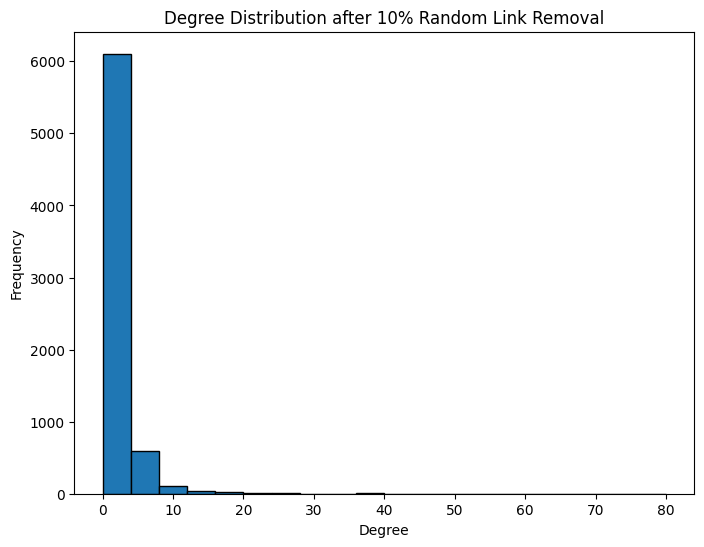

Network Metrics after 10% Random Link Removal:
{'Size of Network': 6878, 'Number of Links': 6190, 'Clustering Coefficient': 0.0, 'Average Path Length': inf}
Giant Component Size after 30% Random Link Removal: 1326


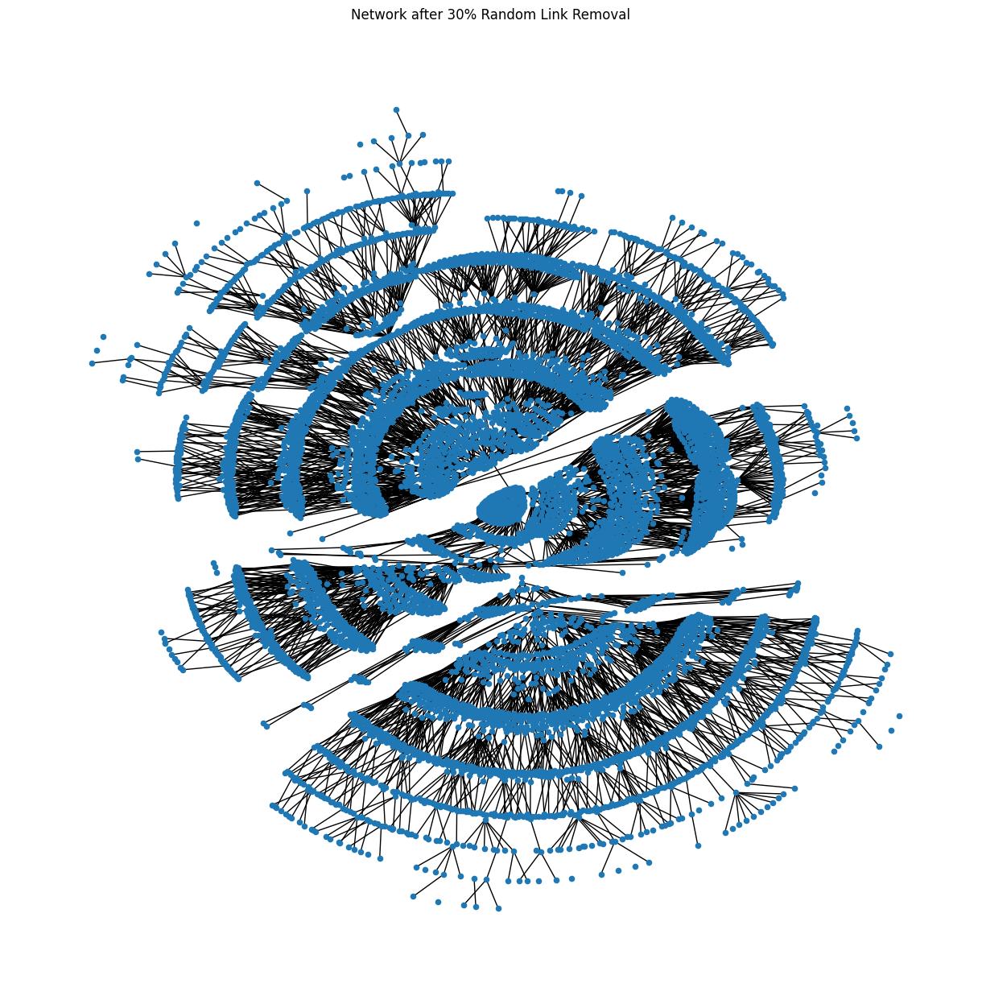

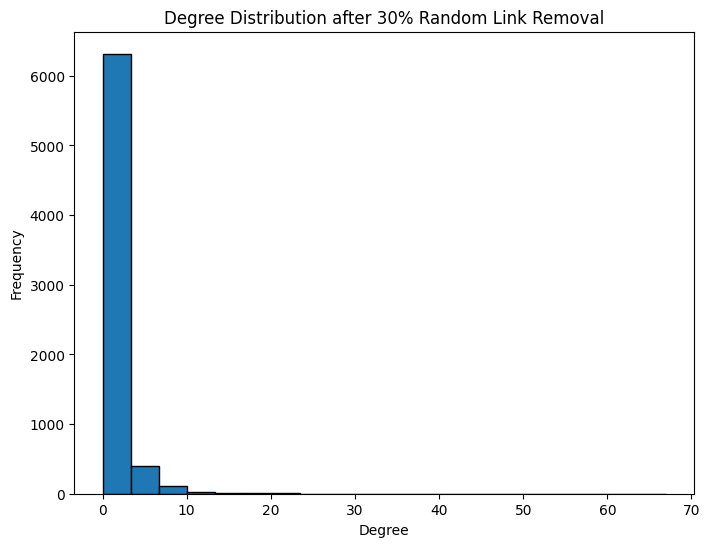

Network Metrics after 30% Random Link Removal:
{'Size of Network': 6878, 'Number of Links': 4814, 'Clustering Coefficient': 0.0, 'Average Path Length': inf}
Giant Component Size after 50% Random Link Removal: 119


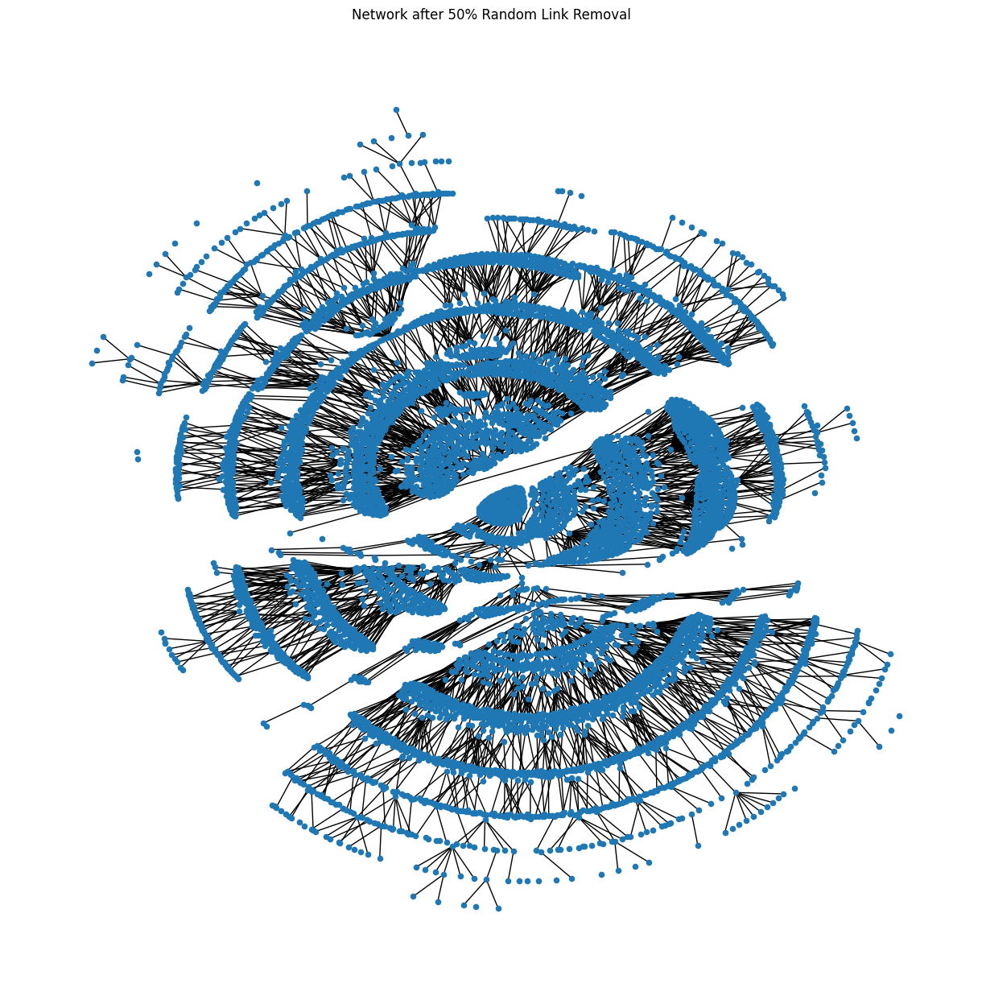

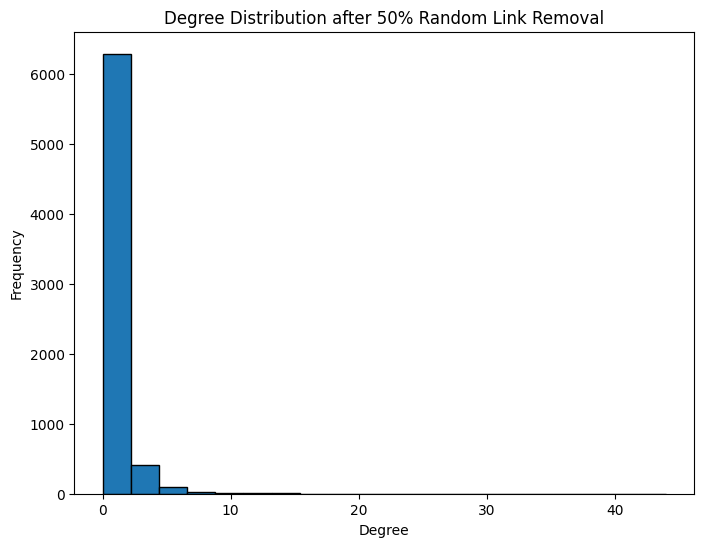

Network Metrics after 50% Random Link Removal:
{'Size of Network': 6878, 'Number of Links': 3439, 'Clustering Coefficient': 0.0, 'Average Path Length': inf}
Giant Component Size after 70% Random Link Removal: 30


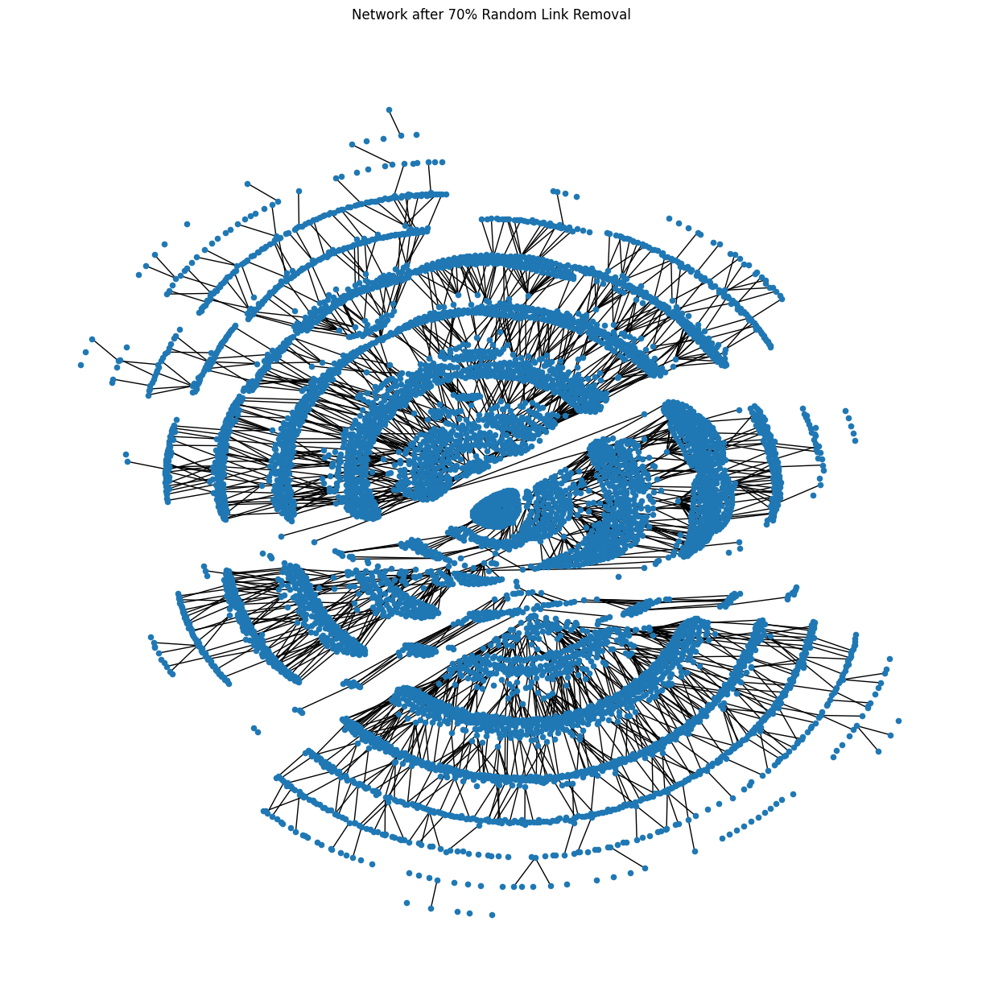

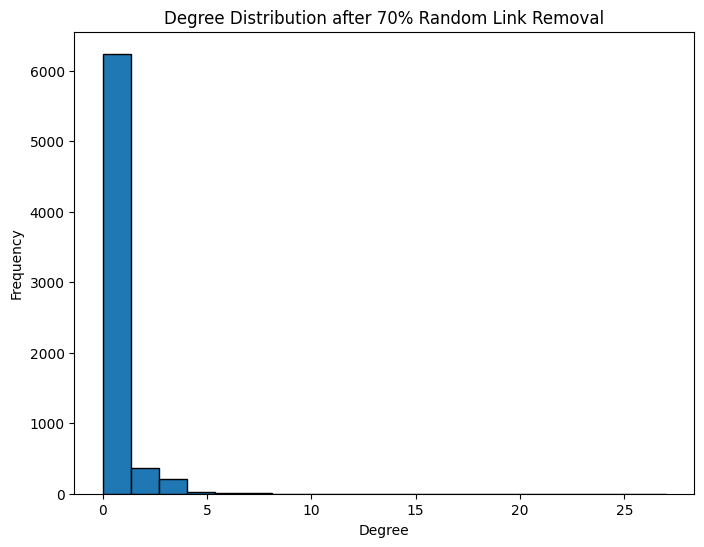

Network Metrics after 70% Random Link Removal:
{'Size of Network': 6878, 'Number of Links': 2064, 'Clustering Coefficient': 0.0, 'Average Path Length': inf}


In [46]:
for removal_fraction in [0.1, 0.3, 0.5, 0.7]:
    G_link_removed, link_removal_impact = random_link_removal(G, removal_fraction)
    print(f"Giant Component Size after {int(removal_fraction * 100)}% Random Link Removal: {link_removal_impact}")
    plot_network(G_link_removed, f"Network after {int(removal_fraction * 100)}% Random Link Removal")
    plot_degree_distribution(G_link_removed, f"Degree Distribution after {int(removal_fraction * 100)}% Random Link Removal")
    print(f"Network Metrics after {int(removal_fraction * 100)}% Random Link Removal:")
    print(network_metrics(G_link_removed))

In [48]:
for removal_fraction in [0.1, 0.3, 0.5, 0.7]:
    G_link_removed, link_removal_impact = random_link_removal(G, removal_fraction)
    print(f"Giant Component Size after {int(removal_fraction * 100)}% Random Link Removal: {link_removal_impact}")
    print(f"Network Metrics after {int(removal_fraction * 100)}% Random Link Removal:")
    print(network_metrics(G_link_removed))

Giant Component Size after 10% Random Link Removal: 4474
Network Metrics after 10% Random Link Removal:
{'Size of Network': 6878, 'Number of Links': 6190, 'Clustering Coefficient': 0.0, 'Average Path Length': inf}
Giant Component Size after 30% Random Link Removal: 563
Network Metrics after 30% Random Link Removal:
{'Size of Network': 6878, 'Number of Links': 4814, 'Clustering Coefficient': 0.0, 'Average Path Length': inf}
Giant Component Size after 50% Random Link Removal: 176
Network Metrics after 50% Random Link Removal:
{'Size of Network': 6878, 'Number of Links': 3439, 'Clustering Coefficient': 0.0, 'Average Path Length': inf}
Giant Component Size after 70% Random Link Removal: 61
Network Metrics after 70% Random Link Removal:
{'Size of Network': 6878, 'Number of Links': 2064, 'Clustering Coefficient': 0.0, 'Average Path Length': inf}


In [49]:
for removal_fraction in [0.1, 0.3, 0.5, 0.7]:
    G_node_removed, node_removal_impact = random_node_removal(G, removal_fraction)
    print(f"Giant Component Size after {int(removal_fraction * 100)}% Random Node Removal: {node_removal_impact}")
    print(f"Network Metrics after {int(removal_fraction * 100)}% Random Node Removal:")
    print(network_metrics(G_node_removed))

Giant Component Size after 10% Random Node Removal: 4533
Network Metrics after 10% Random Node Removal:
{'Size of Network': 6191, 'Number of Links': 5705, 'Clustering Coefficient': 0.0, 'Average Path Length': inf}
Giant Component Size after 30% Random Node Removal: 1196
Network Metrics after 30% Random Node Removal:
{'Size of Network': 4815, 'Number of Links': 3360, 'Clustering Coefficient': 0.0, 'Average Path Length': inf}
Giant Component Size after 50% Random Node Removal: 149
Network Metrics after 50% Random Node Removal:
{'Size of Network': 3439, 'Number of Links': 1691, 'Clustering Coefficient': 0.0, 'Average Path Length': inf}
Giant Component Size after 70% Random Node Removal: 41
Network Metrics after 70% Random Node Removal:
{'Size of Network': 2064, 'Number of Links': 618, 'Clustering Coefficient': 0.0, 'Average Path Length': inf}


In [52]:
top_degree = sorted(degree_centrality.items(), key=lambda x: x[1], reverse=True)[:100]


In [53]:
for num_nodes in [10, 20, 50, 100]:
    targeted_nodes = [node for node, _ in top_degree[:num_nodes]]  
    G_targeted_removed, targeted_removal_impact = targeted_node_removal(G, targeted_nodes)
    print(f"Giant Component Size after removing top {num_nodes} nodes: {targeted_removal_impact}")
    print(f"Network Metrics after removing top {num_nodes} nodes:")
    print(network_metrics(G_targeted_removed))

Giant Component Size after removing top 10 nodes: 6046
Network Metrics after removing top 10 nodes:
{'Size of Network': 6868, 'Number of Links': 6313, 'Clustering Coefficient': 0.0, 'Average Path Length': inf}
Giant Component Size after removing top 20 nodes: 5118
Network Metrics after removing top 20 nodes:
{'Size of Network': 6858, 'Number of Links': 6035, 'Clustering Coefficient': 0.0, 'Average Path Length': inf}
Giant Component Size after removing top 50 nodes: 2276
Network Metrics after removing top 50 nodes:
{'Size of Network': 6828, 'Number of Links': 5507, 'Clustering Coefficient': 0.0, 'Average Path Length': inf}
Giant Component Size after removing top 100 nodes: 265
Network Metrics after removing top 100 nodes:
{'Size of Network': 6778, 'Number of Links': 4901, 'Clustering Coefficient': 0.0, 'Average Path Length': inf}


In [51]:
for conducting_fraction in [0.9, 0.7, 0.5, 0.3]:
    G_viral_attack, viral_attack_impact = viral_attack(G, conducting_fraction)
    print(f"Giant Component Size after {int((1 - conducting_fraction) * 100)}% Viral Attack: {viral_attack_impact}")
    print(f"Network Metrics after {int((1 - conducting_fraction) * 100)}% Viral Attack:")
    print(network_metrics(G_viral_attack))

Giant Component Size after 9% Viral Attack: 4526
Network Metrics after 9% Viral Attack:
{'Size of Network': 6878, 'Number of Links': 6191, 'Clustering Coefficient': 0.0, 'Average Path Length': inf}
Giant Component Size after 30% Viral Attack: 767
Network Metrics after 30% Viral Attack:
{'Size of Network': 6878, 'Number of Links': 4827, 'Clustering Coefficient': 0.0, 'Average Path Length': inf}
Giant Component Size after 50% Viral Attack: 424
Network Metrics after 50% Viral Attack:
{'Size of Network': 6878, 'Number of Links': 3485, 'Clustering Coefficient': 0.0, 'Average Path Length': inf}
Giant Component Size after 70% Viral Attack: 129
Network Metrics after 70% Viral Attack:
{'Size of Network': 6878, 'Number of Links': 2106, 'Clustering Coefficient': 0.0, 'Average Path Length': inf}
